In [1]:
from google.colab import files
uploaded = files.upload()

Saving vehicle.csv to vehicle.csv
Saving casualty.csv to casualty.csv
Saving accident.csv to accident.csv


In [69]:
import pandas as pd
import io
import seaborn as sns
df = pd.read_csv(io.BytesIO(uploaded['accident.csv']))
df
df1 = pd.read_csv(io.BytesIO(uploaded['vehicle.csv']))
df2 = pd.read_csv(io.BytesIO(uploaded['casualty.csv']))



In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 562439 entries, 0 to 562438
Data columns (total 36 columns):
 #   Column                                       Non-Null Count   Dtype  
---  ------                                       --------------   -----  
 0   accident_index                               562439 non-null  object 
 1   accident_year                                562439 non-null  int64  
 2   accident_reference                           562439 non-null  object 
 3   location_easting_osgr                        562306 non-null  float64
 4   location_northing_osgr                       562306 non-null  float64
 5   longitude                                    562296 non-null  float64
 6   latitude                                     562296 non-null  float64
 7   police_force                                 562439 non-null  int64  
 8   accident_severity                            562439 non-null  int64  
 9   number_of_vehicles                           562439 non-nul

In [4]:
df.describe()

,accident_year,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,number_of_casualties,day_of_week,...,pedestrian_crossing_human_control,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag
count,562439.000000,562306.000000,5.623060e+05,562296.000000,562296.000000,562439.000000,562439.000000,562439.000000,562439.000000,562439.000000,...,562439.000000,562439.000000,562439.000000,562439.000000,562439.000000,562439.000000,562439.000000,562439.000000,562439.000000,562439.000000
mean,2018.841359,453092.344542,2.791175e+05,-1.239441,52.399317,27.988936,2.780095,1.841149,1.295324,4.113657,...,0.280077,1.111763,2.025557,1.650188,1.378297,0.223919,0.175210,1.324426,1.355663,1.687587
std,1.413635,94486.230396,1.504202e+05,1.384135,1.355003,24.704728,0.446690,0.704657,0.734110,1.929746,...,1.510484,2.349190,1.717887,1.824607,0.955681,1.260399,1.138232,0.468643,0.592823,0.841438
min,2017.000000,64084.000000,1.023500e+04,-7.525273,49.912362,1.000000,1.000000,1.000000,1.000000,1.000000,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000
25%,2018.000000,389237.000000,1.754600e+05,-2.161819,51.464992,4.000000,3.000000,1.000000,1.000000,2.000000,...,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,1.000000,1.000000,2.000000
50%,2019.000000,459554.500000,2.191370e+05,-1.121003,51.858047,22.000000,3.000000,2.000000,1.000000,4.000000,...,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,1.000000,1.000000,2.000000
75%,2020.000000,529434.750000,3.860650e+05,-0.134684,53.368628,45.000000,3.000000,2.000000,1.000000,6.000000,...,0.000000,0.000000,4.000000,1.000000,2.000000,0.000000,0.000000,2.000000,2.000000,2.000000
max,2021.000000,655391.000000,1.209512e+06,1.759641,60.763722,99.000000,3.000000,24.000000,59.000000,7.000000,...,9.000000,9.000000,7.000000,9.000000,9.000000,9.000000,9.000000,3.000000,3.000000,2.000000


In [5]:
df.columns

Index(['accident_index', 'accident_year', 'accident_reference',
       'location_easting_osgr', 'location_northing_osgr', 'longitude',
       'latitude', 'police_force', 'accident_severity', 'number_of_vehicles',
       'number_of_casualties', 'date', 'day_of_week', 'time',
       'local_authority_district', 'local_authority_ons_district',
       'local_authority_highway', 'first_road_class', 'first_road_number',
       'road_type', 'speed_limit', 'junction_detail', 'junction_control',
       'second_road_class', 'second_road_number',
       'pedestrian_crossing_human_control',
       'pedestrian_crossing_physical_facilities', 'light_conditions',
       'weather_conditions', 'road_surface_conditions',
       'special_conditions_at_site', 'carriageway_hazards',
       'urban_or_rural_area', 'did_police_officer_attend_scene_of_accident',
       'trunk_road_flag', 'lsoa_of_accident_location'],
      dtype='object')

In [6]:
# Missing values
df.isna()

,accident_index,accident_year,accident_reference,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,...,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,lsoa_of_accident_location
0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
562434,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
562435,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
562436,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
562437,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [7]:
missing= df.isna().sum().sort_values(ascending=False)
missing

longitude                                      143
latitude                                       143
location_easting_osgr                          133
location_northing_osgr                         133
accident_index                                   0
weather_conditions                               0
junction_control                                 0
second_road_class                                0
second_road_number                               0
pedestrian_crossing_human_control                0
pedestrian_crossing_physical_facilities          0
light_conditions                                 0
special_conditions_at_site                       0
road_surface_conditions                          0
speed_limit                                      0
carriageway_hazards                              0
urban_or_rural_area                              0
did_police_officer_attend_scene_of_accident      0
trunk_road_flag                                  0
junction_detail                

<Axes: >

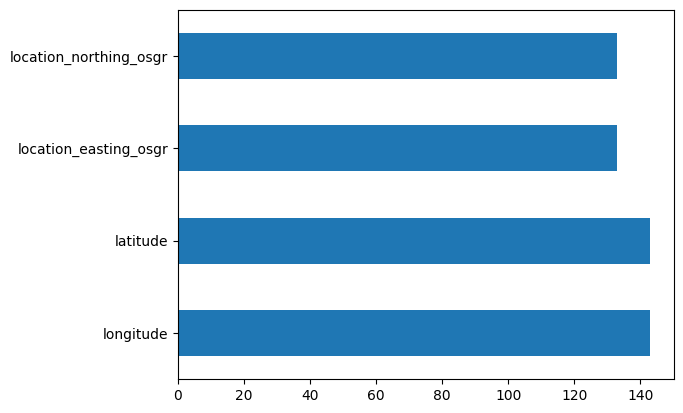

In [8]:
missing[missing!= 0].plot(kind='barh')

In [9]:
import datetime as dt
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

from sklearn.model_selection import TimeSeriesSplit
plt.style.use('ggplot')
%config InlineBackend.figure_format = 'retina'
import warnings
warnings.filterwarnings('ignore')

Start Latitude & Longitude

In [15]:
df.latitude

0         51.650061
1         51.522425
2         51.514096
3         51.624832
4         51.573408
            ...    
562434    55.958152
562435    54.902512
562436    57.634805
562437    55.970735
562438    54.885252
Name: latitude, Length: 562439, dtype: float64

In [16]:
df.longitude

0        -0.080107
1        -0.173845
2        -0.052969
3        -0.060658
4        -0.072372
            ...   
562434   -3.194076
562435   -4.010304
562436   -2.716825
562437   -3.172192
562438   -4.019126
Name: longitude, Length: 562439, dtype: float64

In [17]:
sample_df = df.sample(int(0.1 * len(df)))

<Axes: xlabel='longitude', ylabel='latitude'>

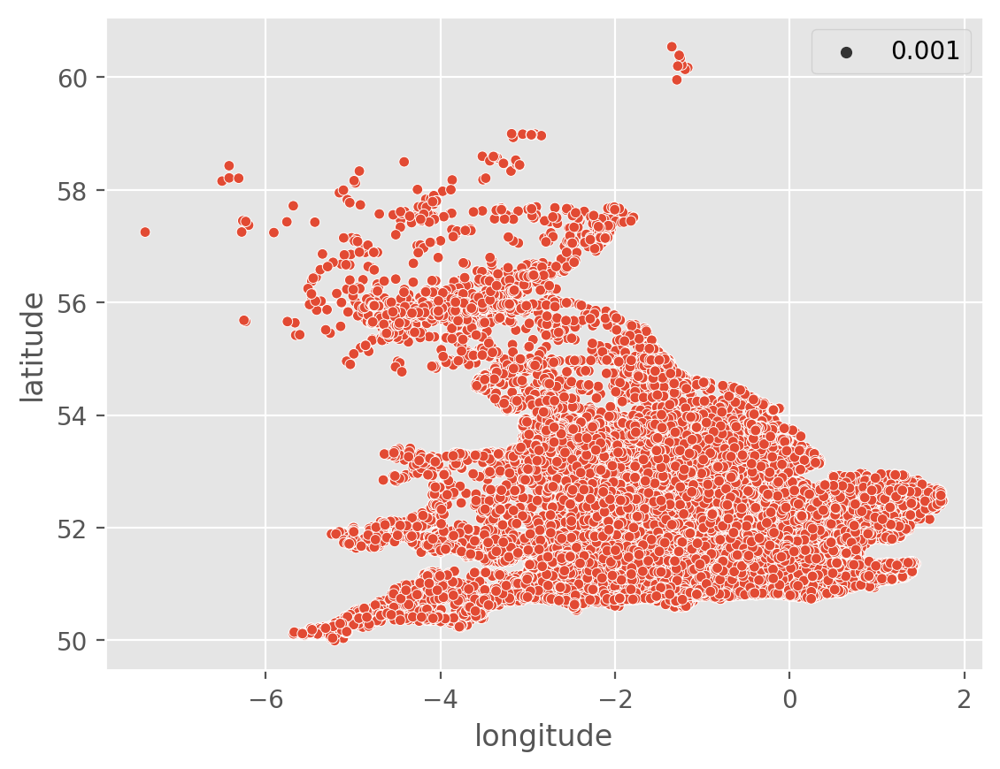

In [18]:
sns.scatterplot(x=sample_df.longitude, y=sample_df.latitude, size=0.001)

In [19]:
import folium

In [20]:
zip(list(df.latitude), list(df.longitude))

In [21]:
from folium.plugins import HeatMap
import branca

In [22]:
sample_df = df.sample(int(0.001 * len(df)))
lat_lon_pairs = list(zip(list(sample_df.latitude), list(sample_df.longitude)))

In [23]:
map = folium.Map()
HeatMap(lat_lon_pairs).add_to(map)
map

In [24]:
df.columns

Index(['accident_index', 'accident_year', 'accident_reference',
       'location_easting_osgr', 'location_northing_osgr', 'longitude',
       'latitude', 'police_force', 'accident_severity', 'number_of_vehicles',
       'number_of_casualties', 'date', 'day_of_week', 'time',
       'local_authority_district', 'local_authority_ons_district',
       'local_authority_highway', 'first_road_class', 'first_road_number',
       'road_type', 'speed_limit', 'junction_detail', 'junction_control',
       'second_road_class', 'second_road_number',
       'pedestrian_crossing_human_control',
       'pedestrian_crossing_physical_facilities', 'light_conditions',
       'weather_conditions', 'road_surface_conditions',
       'special_conditions_at_site', 'carriageway_hazards',
       'urban_or_rural_area', 'did_police_officer_attend_scene_of_accident',
       'trunk_road_flag', 'lsoa_of_accident_location'],
      dtype='object')

In [25]:
datad = df.iloc[2500:7000]


In [26]:
def popup_html(row):
    i = row
    year=df['accident_year'].iloc[i] 
    id=df['accident_reference'].iloc[i]
    long = df['longitude'].iloc[i] 
    lat=df['latitude'].iloc[i] 
    severity = df['accident_severity'].iloc[i]                     
    vechicles = df['number_of_vehicles'].iloc[i]
    casualties = df['number_of_casualties'].iloc[i]
    time = df['time'].iloc[i]


    left_col_color = "#19a7bd"
    right_col_color = "#f2f0d3"
    
    html = """<!DOCTYPE html>
<html>
<head>
<h4 style="margin-bottom:10"; width="200px">{}</h4>""".format(year) + """
</head>
    <table style="height: 126px; width: 350px;">
<tbody>
<tr>
<td style="background-color: """+ left_col_color +""";"><span style="color: #ffffff;">Accident_reference</span></td>
<td style="width: 150px;background-color: """+ right_col_color +""";">{}</td>""".format(id) + """
</tr>
<tr>
<td style="background-color: """+ left_col_color +""";"><span style="color: #ffffff;">Longitude</span></td>
<td style="width: 150px;background-color: """+ right_col_color +""";">{}</td>""".format(long) + """
</tr>
<tr>
<td style="background-color: """+ left_col_color +""";"><span style="color: #ffffff;">Latitude</span></td>
<td style="width: 150px;background-color: """+ right_col_color +""";">{}</td>""".format(lat) + """
</tr>
<tr>
<td style="background-color: """+ left_col_color +""";"><span style="color: #ffffff;">Accident_severity</span></td>
<td style="width: 150px;background-color: """+ right_col_color +""";">{}</td>""".format(severity) + """
</tr>
<tr>
<td style="background-color: """+ left_col_color +""";"><span style="color: #ffffff;">Number_of_vehicles</span></td>
<td style="width: 150px;background-color: """+ right_col_color +""";">{}</td>""".format(vechicles) + """
</tr>
<tr>
<td style="background-color: """+ left_col_color +""";"><span style="color: #ffffff;">Number_of_casualties</span></td>
<td style="width: 150px;background-color: """+ right_col_color +""";">{}</td>""".format(casualties) + """
</tr>
<tr>
<td style="background-color: """+ left_col_color +""";"><span style="color: #ffffff;">Time</span></td>
<td style="width: 150px;background-color: """+ right_col_color +""";">{}</td>""".format(time) + """
</tr>
</tbody>
</table>
</html>
"""
    return html

In [27]:
location = datad['latitude'].mean(), datad['longitude'].mean()
m = folium.Map(location=location,zoom_start=15)

#The num of casulaties for each accident can be determined and the colour assigned then added to the basemap.
for i in range(0,len(datad)):
    num_of_casualties = datad['number_of_casualties'].iloc[i]
    if num_of_casualties == 1:
        color = 'blue'
    elif num_of_casualties == 2:
        color = 'green'
    else:
        color = 'red'
    html = popup_html(i)
    iframe = branca.element.IFrame(html=html,width=510,height=280)
    popup = folium.Popup(folium.Html(html, script=True), max_width=500)
    # popup = folium.Popup('Accident', parse_html=True) 
    folium.Marker([datad['latitude'].iloc[i],datad['longitude'].iloc[i]],popup=popup,icon=folium.Icon(color=color, icon='info-sign')).add_to(m)

In [28]:
m

<Axes: >

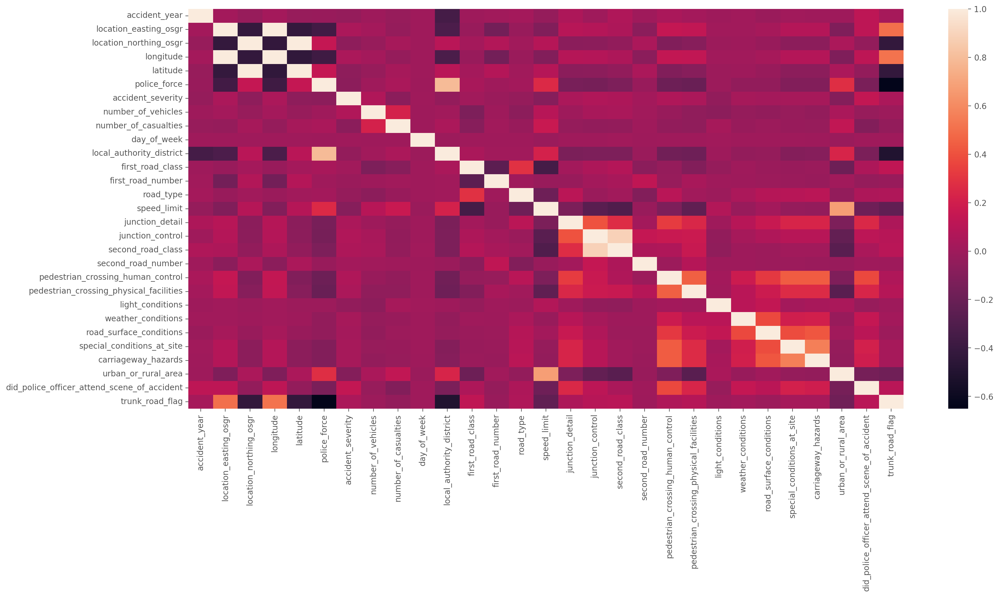

In [29]:
import matplotlib.pyplot as plt
corr =df.corr()
plt.subplots(figsize=(20,9))
sns.heatmap(corr)

Time of the accidents

In [33]:
acc_time = df[['date','day_of_week','time']]

In [34]:
acc_time.dropna(axis=0,inplace=True)

In [36]:
#creating the column, hour,day,month and year
#creating year column
def year(string):
    return int(string[6:10])
acc_time['year']=acc_time['date'].apply(lambda x: year(x))
#creating month column
def month(string):
    return int(string[3:5])
acc_time['month']=acc_time['date'].apply(lambda x: month(x))
#creating day column
def day(string):
    return int(string[0:2])
acc_time['day']=acc_time['date'].apply(lambda x: day(x))
#creating hour column
def hour(string):
    s=string[0:2]
    return int(s)
acc_time['hour']=acc_time['time'].apply(lambda x: hour(x))

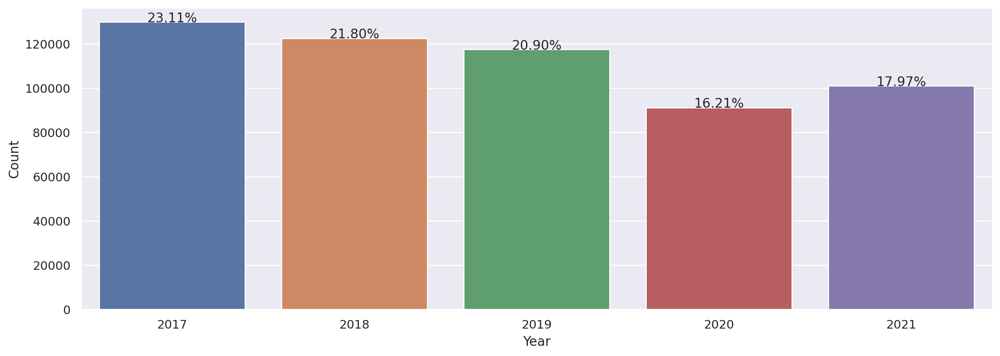

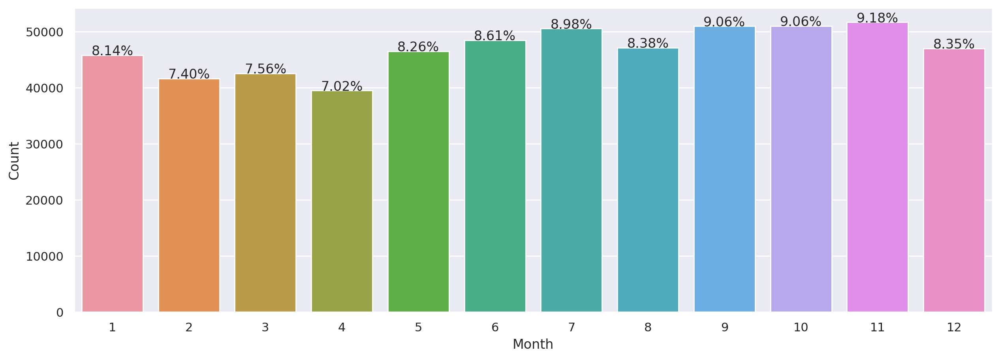

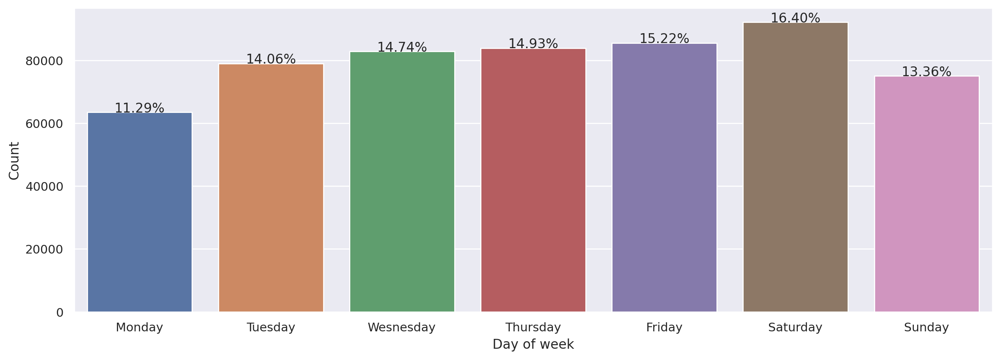

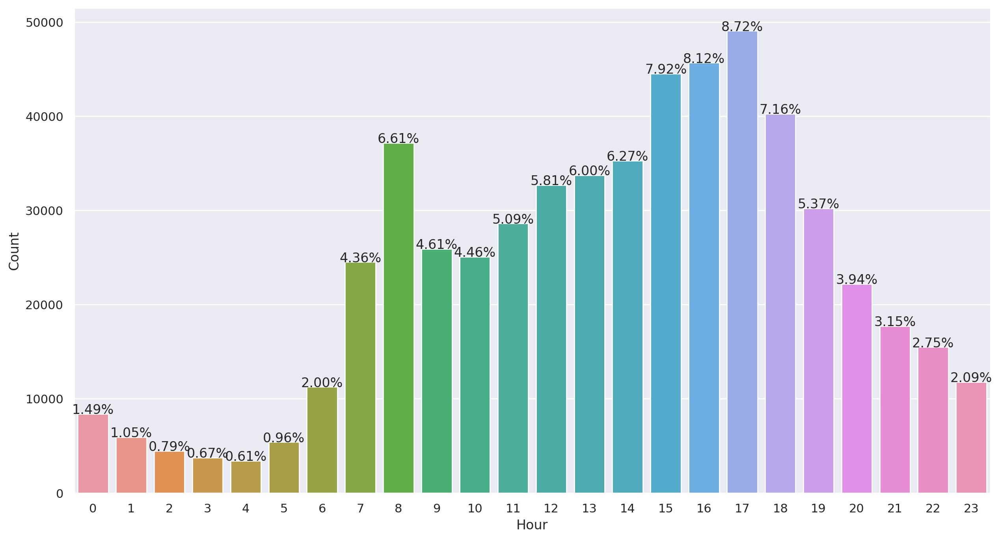

In [40]:
sns.set(style="darkgrid")
plt.figure(figsize=(15,5))
yearplot = sns.countplot(x='year',data=acc_time)
yearplot.set(xlabel='Year', ylabel='Count')
for p in yearplot.patches: 
    height = p.get_height() 
    yearplot.text(p.get_x()+p.get_width()/2., 
      height + 3, 
      '{:1.2f}'.format((height/len(acc_time))*100)+'%',  
      ha="center") 
plt.show()
sns.set(style="darkgrid")
plt.figure(figsize=(15,5))
monthplot = sns.countplot(x='month',data=acc_time)
monthplot.set(xlabel='Month', ylabel='Count')
for p in monthplot.patches: 
    height = p.get_height() 
    monthplot.text(p.get_x()+p.get_width()/2., 
      height + 3, 
      '{:1.2f}'.format((height/len(acc_time))*100)+'%',  
      ha="center") 
plt.show()
sns.set(style="darkgrid")
plt.figure(figsize=(15,5))
weekplot = sns.countplot(x='day_of_week',data=acc_time)
weekplot.set(xlabel='Day of week', ylabel='Count')
for p in weekplot.patches: 
    height = p.get_height() 
    weekplot.text(p.get_x()+p.get_width()/2., 
      height + 3, 
      '{:1.2f}'.format((height/len(acc_time))*100)+'%',  
      ha="center") 
weekplot.set(xticklabels=['Monday','Tuesday','Wesnesday','Thursday','Friday','Saturday','Sunday'])
plt.show()
sns.set(style="darkgrid")
plt.figure(figsize=(15,8))
Hourplot = sns.countplot(x='hour',data=acc_time)
Hourplot.set(xlabel='Hour', ylabel='Count')
for p in Hourplot.patches:
  height = p.get_height() 
  Hourplot.text(p.get_x()+p.get_width()/2., 
      height + 3, 
      '{:1.2f}'.format((height/len(acc_time))*100)+'%',  
      ha="center") 
plt.show()

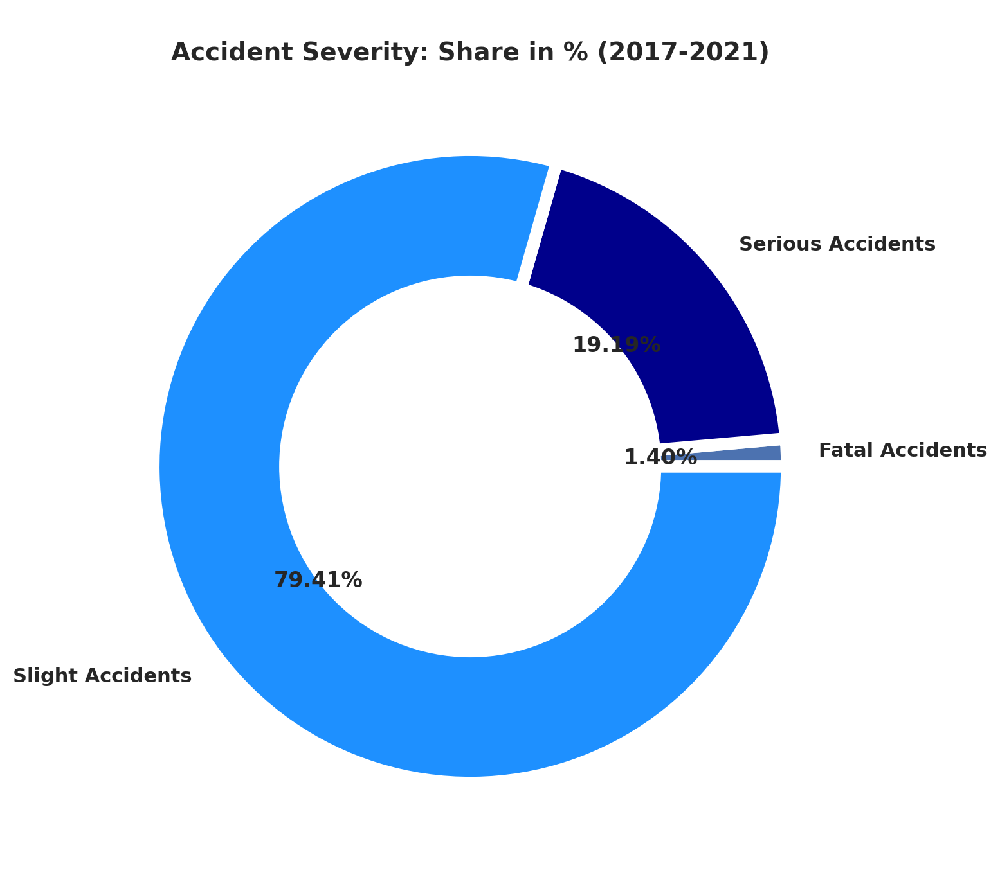

In [88]:
fatal   = df.accident_severity.value_counts()[1]
serious = df.accident_severity.value_counts()[2]
slight  = df.accident_severity.value_counts()[3]

names = ['Fatal Accidents','Serious Accidents', 'Slight Accidents']
size  = [fatal, serious, slight]

# create a pie chart
plt.pie(x=size, labels=names, colors=['b', 'darkblue', 'dodgerblue'], 
        autopct='%1.2f%%', pctdistance=0.6, textprops=dict(fontweight='bold'),
        wedgeprops={'linewidth':7, 'edgecolor':'white'})

# create circle for the center of the plot to make the pie look like a donut
my_circle = plt.Circle((0,0), 0.6, color='white')
# plot the donut chart
fig = plt.gcf()
fig.set_size_inches(8,8)
fig.gca().add_artist(my_circle)
plt.title('\nAccident Severity: Share in % (2017-2021)', fontsize=14, fontweight='bold')
plt.show()